# US Accidents Explotary Data Analysis 

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline 


### ask and answer questions: 
1. are there more accidents in colder and warmer regions?  
2. which states have the highest no. of accidents or ? also per capita? 
3. does new york  show up in the data? if yes, why is the count lower if this is the most populated city in the US? 
4. among the top 100 cities in number of accidents, which states do they belong to most frequently? 
5. what time of a day are accident frequent in?
6. which day of week the most accidents occur? 
7. which month have the most accident ?
8. what is the trend of accidents year over year(increasing/decreasing)?  
9. At which weather condition most of the accidents occured (can also take insights from moth wise accidents)
10. can we find out the relation between accidents occured in a year and weather.

In [2]:
dataset=pd.read_csv('US_Accidents_Dec20_updated.csv')

## Data Preparation and Cleaning 

In [3]:
dataset.head(5)

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2716600,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.10891,-83.09286,40.11206,-83.03187,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2716601,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.86542,-84.06280,39.86501,-84.04873,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-2716602,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.10266,-84.52468,39.10209,-84.52396,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-2716603,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.10148,-84.52341,39.09841,-84.52241,0.219,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
4,A-2716604,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.06213,-81.53784,41.06217,-81.53547,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day


In [4]:
dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1516064 entries, 0 to 1516063
Data columns (total 47 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   ID                     1516064 non-null  object 
 1   Severity               1516064 non-null  int64  
 2   Start_Time             1516064 non-null  object 
 3   End_Time               1516064 non-null  object 
 4   Start_Lat              1516064 non-null  float64
 5   Start_Lng              1516064 non-null  float64
 6   End_Lat                1516064 non-null  float64
 7   End_Lng                1516064 non-null  float64
 8   Distance(mi)           1516064 non-null  float64
 9   Description            1516064 non-null  object 
 10  Number                 469969 non-null   float64
 11  Street                 1516064 non-null  object 
 12  Side                   1516064 non-null  object 
 13  City                   1515981 non-null  object 
 14  County            

In [5]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Severity,1516064.0,2.238630,0.608148,1.000000,2.000000,2.000000,2.000000,4.000000e+00
Start_Lat,1516064.0,36.900558,5.165653,24.570222,33.854225,37.351130,40.725927,4.900058e+01
Start_Lng,1516064.0,-98.599194,18.496022,-124.497567,-118.207575,-94.381003,-80.874690,-6.711317e+01
End_Lat,1516064.0,36.900606,5.165629,24.570110,33.854204,37.351342,40.725930,4.907500e+01
End_Lng,1516064.0,-98.599010,18.495903,-124.497829,-118.207746,-94.379875,-80.874490,-6.710924e+01
Distance(mi),1516064.0,0.587262,1.632659,0.000000,0.000000,0.178000,0.594000,1.551860e+02
Number,469969.0,8907.533114,22421.896710,0.000000,1212.000000,4000.000000,10100.000000,9.999997e+06
Temperature(F),1473031.0,59.584597,18.273164,-89.000000,47.000000,61.000000,73.000000,1.706000e+02
Wind_Chill(F),1066748.0,55.109760,21.127345,-89.000000,40.800000,57.000000,71.000000,1.130000e+02
Humidity(%),1470555.0,64.659601,23.259865,1.000000,48.000000,68.000000,84.000000,1.000000e+02


In [6]:
dataset.shape

(1516064, 47)

In [7]:
missing_percentages=dataset.isnull().sum().sort_values(ascending=False)/len(dataset)
missing_percentages

Number                   0.690007
Precipitation(in)        0.336760
Wind_Chill(F)            0.296370
Wind_Speed(mph)          0.084998
Humidity(%)              0.030018
Visibility(mi)           0.029162
Weather_Condition        0.029027
Temperature(F)           0.028385
Wind_Direction           0.027610
Pressure(in)             0.023926
Weather_Timestamp        0.019962
Airport_Code             0.002802
Timezone                 0.001518
Zipcode                  0.000617
City                     0.000055
Nautical_Twilight        0.000055
Astronomical_Twilight    0.000055
Civil_Twilight           0.000055
Sunrise_Sunset           0.000055
Amenity                  0.000000
Bump                     0.000000
Severity                 0.000000
Start_Time               0.000000
End_Time                 0.000000
Start_Lat                0.000000
Start_Lng                0.000000
End_Lat                  0.000000
End_Lng                  0.000000
Distance(mi)             0.000000
Description   

number column can also be removed cause it does not provide anhy conclusive relation with any other thing and alsowe can see the number of negative values are more than 50% and cannot be replaced.   


## Exploratory Data analysis
### columns that are to be analyzed  
1. city 
2. start time 
3. start lat, sart lng 
4. weather cond. 

## Cities 

<AxesSubplot:>

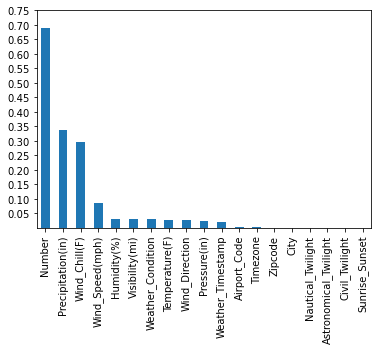

In [8]:
yticks=[0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75]
missing_percentages[missing_percentages!=0 ].plot(kind ='bar',yticks=yticks)

In [10]:
dataset.drop('Number',axis=1,inplace=True) 

In [11]:
cities=dataset.City.unique()
len(cities)

10658

In [12]:
cities_by_accidents=dataset.City.value_counts()
cities_by_accidents

Los Angeles         39984
Miami               36233
Charlotte           22203
Houston             20843
Dallas              19497
                    ...  
Closter                 1
Coleharbor              1
Okaton                  1
Garfield Heights        1
Burdette                1
Name: City, Length: 10657, dtype: int64

<AxesSubplot:>

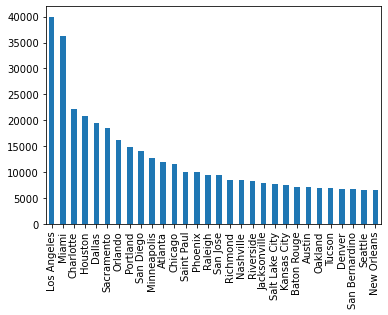

In [13]:
cities_by_accidents[:30].plot(kind='bar')

<AxesSubplot:xlabel='City', ylabel='Density'>

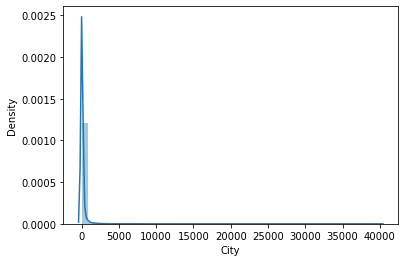

In [14]:
sns.distplot(cities_by_accidents)

In [15]:
high_accidents_cities=cities_by_accidents[cities_by_accidents>=1000]
low_accidents_cities=cities_by_accidents[cities_by_accidents<1000]


In [16]:
percentage_of_high_accidents=len(high_accidents_cities)/len(cities)*100
str(percentage_of_high_accidents)+'%'

'2.3550384687558643%'

<AxesSubplot:xlabel='City', ylabel='Count'>

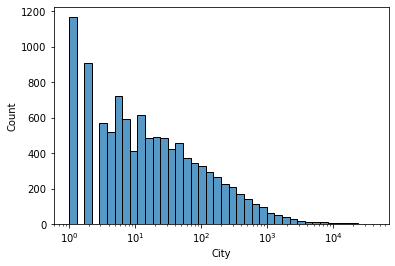

In [17]:
sns.histplot(cities_by_accidents,log_scale=True,bins=40 )

In the above graph (log scale) we can see that the all the major chunk of accident fall between 100 to 1000 accidents. the biggest bar at 1 shows that there is some kind of missing dataor something. 

In [18]:
cities_by_accidents[cities_by_accidents==1]

Chelan              1
Clarkson            1
Colstrip            1
Petrolia            1
Skamokawa           1
                   ..
Closter             1
Coleharbor          1
Okaton              1
Garfield Heights    1
Burdette            1
Name: City, Length: 1167, dtype: int64

In [19]:
cities_by_accidents[cities_by_accidents==2]

Waves          2
Novelty        2
North Rose     2
Grass Range    2
Gahanna        2
              ..
Glenburn       2
Knox City      2
Horner         2
Indian Lake    2
White Bluff    2
Name: City, Length: 909, dtype: int64

# start time 

In [20]:
dataset.Start_Time

0          2016-02-08 00:37:08
1          2016-02-08 05:56:20
2          2016-02-08 06:15:39
3          2016-02-08 06:15:39
4          2016-02-08 06:51:45
                  ...         
1516059    2019-08-23 18:03:25
1516060    2019-08-23 19:11:30
1516061    2019-08-23 19:00:21
1516062    2019-08-23 19:00:21
1516063    2019-08-23 18:52:06
Name: Start_Time, Length: 1516064, dtype: object

In [21]:
dataset.Start_Time=pd.to_datetime(dataset.Start_Time)

In [22]:
dataset.Start_Time[0]

Timestamp('2016-02-08 00:37:08')

In [23]:
dataset.Start_Time[0].hour 

0

In [24]:
dataset['hours']=dataset.Start_Time.dt.hour 

In [25]:
dataset.hours 

0           0
1           5
2           6
3           6
4           6
           ..
1516059    18
1516060    19
1516061    19
1516062    19
1516063    18
Name: hours, Length: 1516064, dtype: int64

<AxesSubplot:xlabel='hours'>

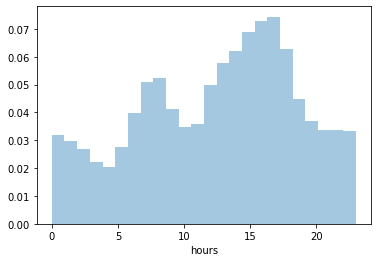

In [26]:
sns.distplot(dataset.hours,bins=24,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

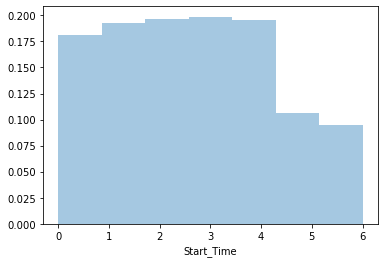

In [27]:
sns.distplot(dataset.Start_Time.dt.dayofweek,bins=7,kde=False,norm_hist=True)

is the distribution of accidents by hour the same on weekends 

<AxesSubplot:xlabel='Start_Time'>

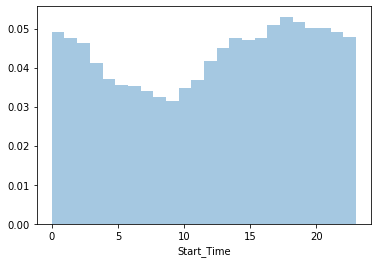

In [28]:
sundays=dataset.Start_Time[dataset.Start_Time.dt.dayofweek==6]
mondays=dataset.Start_Time[dataset.Start_Time.dt.dayofweek==0]
sns.distplot(sundays.dt.hour,bins=24,kde=False,norm_hist=True)


<AxesSubplot:xlabel='Start_Time'>

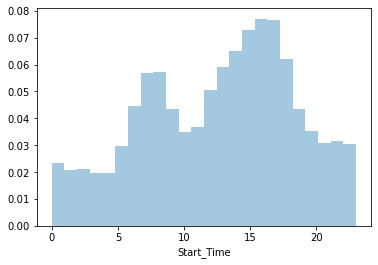

In [29]:
sns.distplot(mondays.dt.hour,bins=24,kde=False,norm_hist=True)

on sudays the data is more distributed having 2 peaks i.e. between 1 am to 4 am and 3 pm to 10 pm 

<AxesSubplot:xlabel='Start_Time'>

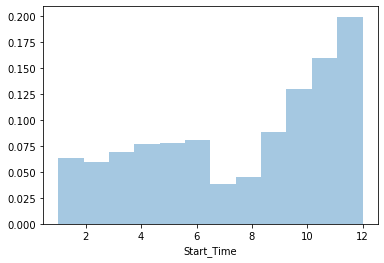

In [30]:
sns.distplot(dataset.Start_Time.dt.month,bins=12,kde=False,norm_hist=True)

Insights- accidents occur more during the time of new year. also the data is from feb 2016 so there is a loss of data for january month 

<AxesSubplot:xlabel='Start_Time'>

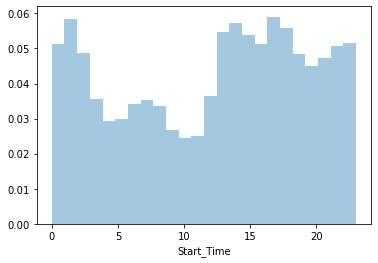

In [31]:
december=dataset.Start_Time[dataset.Start_Time.dt.month==12]
sns.distplot(december.dt.hour,bins=24 ,kde=False,norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

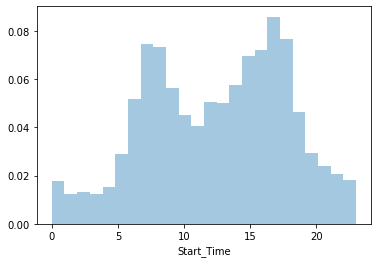

In [32]:
january=dataset.Start_Time[dataset.Start_Time.dt.month==1]
sns.distplot(january.dt.hour, bins=24, kde=False, norm_hist=True)

<AxesSubplot:xlabel='Start_Time'>

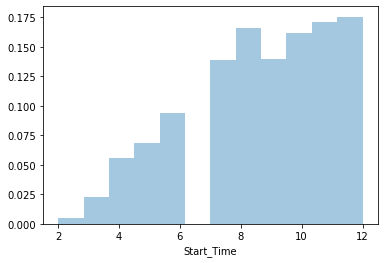

In [33]:
dataset_2016=dataset[dataset.Start_Time.dt.year==2016]
sns.distplot(dataset_2016.Start_Time.dt.month,bins=12 ,kde=False,norm_hist=True )

**This shows there is some of the missing data in the year 2016.**
(or may be the problem is with the source of the data  )

### start lattitude and longitude

In [34]:
dataset.Start_Lat

0          40.10891
1          39.86542
2          39.10266
3          39.10148
4          41.06213
             ...   
1516059    34.00248
1516060    32.76696
1516061    33.77545
1516062    33.99246
1516063    34.13393
Name: Start_Lat, Length: 1516064, dtype: float64

In [35]:
dataset.Start_Lng

0          -83.09286
1          -84.06280
2          -84.52468
3          -84.52341
4          -81.53784
             ...    
1516059   -117.37936
1516060   -117.14806
1516061   -117.84779
1516062   -118.40302
1516063   -117.23092
Name: Start_Lng, Length: 1516064, dtype: float64

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

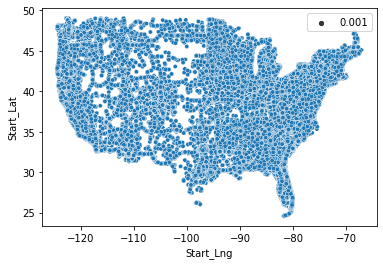

In [36]:
sns.scatterplot(x=dataset.Start_Lng,y=dataset.Start_Lat,size=0.001)

lets take the small sample of the data 

In [37]:
sample_data=dataset.sample(int(0.2*len(dataset)))

<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

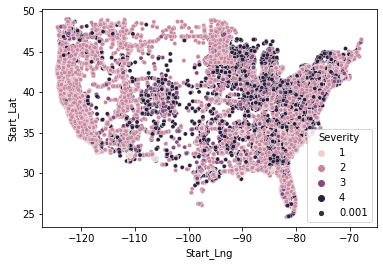

In [69]:
sns.scatterplot(x=sample_data.Start_Lng,y=sample_data.Start_Lat,size=0.001,hue=sample_data.Severity)

In [39]:
import folium 
from folium import plugins
from folium.plugins import HeatMap

In [40]:
for x in dataset[['Start_Lat','Start_Lng']].sample(100).iteritems():
    print(x[1])

808630     40.775060
1245259    44.966670
707341     30.440553
600432     33.938662
1371249    33.893048
             ...    
1122164    46.065160
545351     30.251831
228735     28.410360
727323     28.760230
957447     37.315040
Name: Start_Lat, Length: 100, dtype: float64
808630     -74.159220
1245259    -93.089370
707341     -81.589050
600432    -117.134727
1371249   -117.880816
              ...    
1122164   -123.691380
545351     -81.587626
228735     -81.627740
727323     -81.265610
957447    -121.909080
Name: Start_Lng, Length: 100, dtype: float64


In [79]:
lat_lng_pairs=list(zip(list(sample_data.Start_Lat),list(sample_data.Start_Lng)))
map=folium.Map(tiles="cartodbpositron",zoom_start=5)
HeatMap(lat_lng_pairs).add_to(map)
map

**(this only contain only 20% of the original data set.)**

### weather condition 

In [45]:
dataset['Weather_Condition']

0             Light Rain
1             Light Rain
2               Overcast
3               Overcast
4               Overcast
               ...      
1516059             Fair
1516060             Fair
1516061    Partly Cloudy
1516062             Fair
1516063             Fair
Name: Weather_Condition, Length: 1516064, dtype: object

In [51]:
weather_condition= dataset.Weather_Condition.unique()
len(weather_condition)

117

In [65]:
accidents_by_weather=dataset.Weather_Condition.value_counts()
accidents_by_weather

Fair                                   465252
Mostly Cloudy                          193595
Clear                                  180223
Cloudy                                 161291
Partly Cloudy                          133102
                                        ...  
Sleet / Windy                               1
Hail                                        1
Dust Whirls                                 1
Thunder and Hail / Windy                    1
Heavy Thunderstorms with Small Hail         1
Name: Weather_Condition, Length: 116, dtype: int64

<AxesSubplot:>

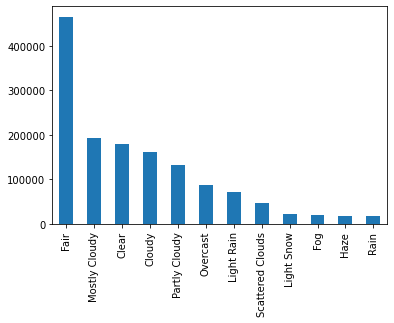

In [73]:
accidents_by_weather[:12].plot(kind='bar')

we can see most of the accidents occur in perfectly fair weather so also we can make the assumption that climate plays very little role in occuring accidents. Also we can have another insight through this is that accidents mostly occur when its perfectly fine weather to go out.  

In [66]:
accidents_by_weather[0]/len(dataset)

0.3068815036832218

# summary and conclusions 
1. no data for New York as it is the most populated state but not included in this dataset 
2. the number of accidents per city decreases exponentially 
2. less than 1.6 % of the cities have more than 1000 yearly accidents 
3. over 1100 cities reported just 1 accident and 900 cities with 2 accidents (need to investigate)
4. a high percentage of accidents occurs between 2 pm to 7 pm.  
5. approx 30% accidents occured during the perfectly fine weather. 